<a href="https://colab.research.google.com/github/abhishtagatya/paintgan-model-comparison/blob/main/cyclegan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## CycleGAN

CycleGAN uses a cycle consistency loss to enable training without the need for paired data. In other words, it can translate from one domain to another without a one-to-one mapping between the source and target domain.

[Paper : Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks](https://arxiv.org/abs/1703.10593)

### Dataset

```
PaintGAN 80K
Just a sliced dataset of Places365 and WikiArt each containing roughly 80,000 content and style images each.
```







### Prelimenary Setup

Setting up and loading dataset from PaintGAN 80K using Tensorflow DataLoader

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip drive/MyDrive/Dataset/paintgan-80k.zip

Streaming output truncated to the last 5000 lines.
  inflating: paintgan-dataset/wikiart/Realism-vincent-van-gogh_houses-with-thatched-roofs-1884.jpg  
  inflating: paintgan-dataset/wikiart/Cubism-nzante-spee_the-wahdoosee-question-1994.jpg  
  inflating: paintgan-dataset/wikiart/Art_Nouveau_Modern-koloman-moser_postcard-to-carl-moll-ver-sacrum-1897.jpg  
  inflating: paintgan-dataset/wikiart/Realism-pyotr-konchalovsky_daisies-1935-1.jpg  
  inflating: paintgan-dataset/wikiart/Northern_Renaissance-albrecht-durer_head-of-an-old-man-in-profile.jpg  
  inflating: paintgan-dataset/wikiart/Northern_Renaissance-albrecht-durer_lion.jpg  
  inflating: paintgan-dataset/wikiart/Impressionism-theo-van-rysselberghe_standing-nude-1919.jpg  
  inflating: paintgan-dataset/wikiart/Post_Impressionism-henri-de-toulouse-lautrec_not_detected_230533-1882.jpg  
  inflating: paintgan-dataset/wikiart/Impressionism-joaquã­n-sorolla_orchard-house-valencia-study-1908.jpg  
  inflating: paintgan-dataset/wikiart/E

In [ ]:
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 14.3 MB/s 


In [ ]:
import os
import glob
import imageio
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds
import tensorflow_addons as tfa

#@title ## Model Training Parameters { display-mode: "both" }
#@markdown Change training parameters based on experimentation

# Defining Training Parameters
MODEL_NAME = "CycleGAN" #@param{type:"string"}
IMAGE_SIZE = (256, 256, 3) #@param{type:"raw"}
BATCH_SIZE = 1 #@param{type:"integer"}
BUFFER_SIZE = 256 #@param{type:"integer"}
EPOCHS =  30#@param{type:"integer"}
CHECKPOINT_PER_EPOCH = 5 #@param{type:"integer"}

AUTOTUNE = tf.data.AUTOTUNE

WIKIART_BASEPATH = "paintgan-dataset/wikiart"
P365_BASEPATH = "paintgan-dataset/places365"

# Loading Image path
content_images = os.listdir(P365_BASEPATH)
content_images = [os.path.join(P365_BASEPATH, path) for path in content_images]

style_images = os.listdir(WIKIART_BASEPATH)
style_images = [os.path.join(WIKIART_BASEPATH, path) for path in style_images]

In [ ]:
# Load the horse-zebra dataset using tensorflow-datasets.
# dataset, _ = tfds.load("cycle_gan/monet2photo", with_info=True, as_supervised=True)
# train_monet, train_photo = dataset["trainA"], dataset["trainB"]
# test_monet, test_photo = dataset["testA"], dataset["testB"]

In [ ]:
# Removing corrupted JPEGs on Unzip process (if any)

from struct import unpack

marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Define Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}

class JPEG:

    def __init__(self, image_file):
        with open(image_file, 'rb') as f:
            self.img_data = f.read()
    
    def decode(self):
        data = self.img_data
        while(True):
            marker, = unpack(">H", data[0:2])
            if marker == 0xffd8:
                data = data[2:]
            elif marker == 0xffd9:
                return
            elif marker == 0xffda:
                data = data[-2:]
            else:
                lenchunk, = unpack(">H", data[2:4])
                data = data[2+lenchunk:]            
            if len(data)==0:
                break        


corrupted = []

for img in tqdm(style_images):
  image = JPEG(img) 
  try:
    image.decode()   
  except:
    corrupted.append(img)

for name in corrupted:
  style_images.remove(name)

100%|██████████| 80000/80000 [03:26<00:00, 387.82it/s]


In [ ]:
def domain_selection(image_list, domain_name):

  new_list = []

  for image in image_list:
    if domain_name in image:
      new_list.append(image)
  return new_list

In [ ]:
style_images = domain_selection(style_images, 'van-gogh')

In [ ]:
len(style_images)

1870

In [ ]:
content_images = content_images[:8000]

In [ ]:
len(content_images)

8000

In [ ]:
def normalize_img(img):
    img = tf.cast(img, dtype=tf.float32)
    # Map values in the range [-1, 1]
    return (img / 127.5) - 1.0

def preprocess_train_image(img):

    img = tf.io.read_file(img)
    img = tf.image.decode_jpeg(img, channels=3)
    # Random flip
    img = tf.image.random_flip_left_right(img)
    # Resize to the original size first
    img = tf.image.resize(img, [IMAGE_SIZE[0], IMAGE_SIZE[1]])
    # Random crop to 256X256
    # Normalize the pixel values in the range [-1, 1]
    img = normalize_img(img)
    return img

def preprocess_test_image(img):

    img = tf.io.read_file(img)
    img = tf.image.decode_jpeg(img, channels=3)

    # Only resizing and normalization for the test images.
    img = tf.image.resize(img, [IMAGE_SIZE[0], IMAGE_SIZE[1]])
    img = normalize_img(img)
    return img

# Train Test Splits
total_content_images = len(content_images)
train_content = content_images[:int(0.8 * total_content_images)]
val_content = content_images[int(0.8 * total_content_images):int(0.9 * total_content_images)]
test_content = content_images[int(0.9 * total_content_images):]

total_style_images = len(style_images)
train_style = style_images[:int(0.8 * total_style_images)]
val_style = style_images[int(0.8 * total_style_images):int(0.9 * total_style_images)]
test_style = style_images[int(0.9 * total_style_images):]

# Build the style and content tf.data datasets
train_style_ds = (
    tf.data.Dataset.from_tensor_slices(train_style)
    .map(preprocess_train_image, num_parallel_calls=AUTOTUNE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
)

val_style_ds = (
    tf.data.Dataset.from_tensor_slices(val_style)
    .map(preprocess_train_image, num_parallel_calls=AUTOTUNE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
)

test_style_ds = (
    tf.data.Dataset.from_tensor_slices(test_style)
    .map(preprocess_test_image, num_parallel_calls=AUTOTUNE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
)

train_content_ds = (
    tf.data.Dataset.from_tensor_slices(train_content)
    .map(preprocess_train_image, num_parallel_calls=AUTOTUNE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
)

val_content_ds = (
    tf.data.Dataset.from_tensor_slices(val_content)
    .map(preprocess_train_image, num_parallel_calls=AUTOTUNE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
)

test_content_ds = (
    tf.data.Dataset.from_tensor_slices(test_content)
    .map(preprocess_test_image, num_parallel_calls=AUTOTUNE)
    .cache()
    .shuffle(BUFFER_SIZE)
    .batch(BATCH_SIZE)
)

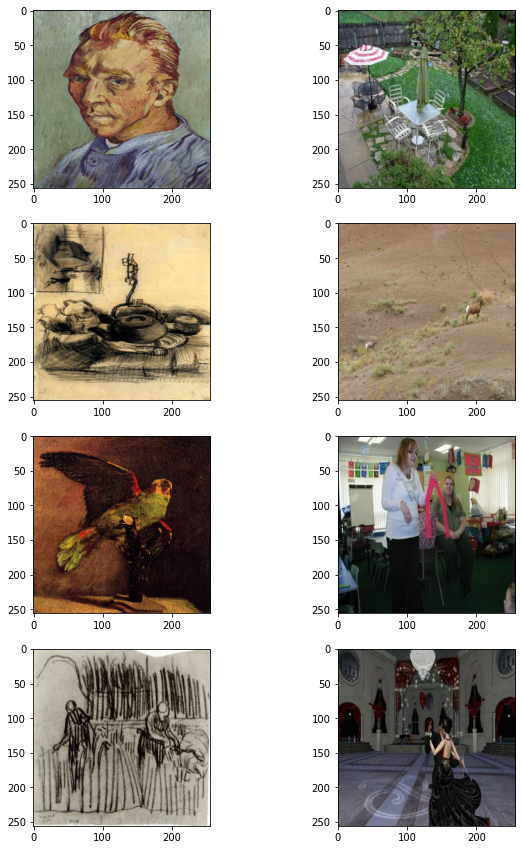

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(train_content_ds.take(4), train_style_ds.take(4))):
    content = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    style = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(style)
    ax[i, 1].imshow(content)
plt.show()

### Model Implementation

In [ ]:
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

In [ ]:
class ReflectionPadding2D(tf.keras.layers.Layer):

  """
    Implements Refletion Padding as a layer

    Args:
      padding(tuple): Amount of padding for the spatial dimensions

    Returns:
      A padded tensor with the same type as the input tensor
  """

  def __init__(self, padding=(1, 1), **kwargs):
    self.padding = tuple(padding)
    super(ReflectionPadding2D, self).__init__(**kwargs)

  def call(self, input_tensor, mask=None):
    padding_width, padding_height = self.padding
    padding_tensor = [
      [0, 0],
      [padding_height, padding_height],
      [padding_width, padding_width],
      [0, 0]
    ]
    return tf.pad(input_tensor, padding_tensor, mode='REFLECT')

In [ ]:
def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False
):

  dim = x.shape[-1]
  input_tensor = x

  x = ReflectionPadding2D()(input_tensor)
  x = tf.keras.layers.Conv2D(
      dim,
      kernel_size,
      strides=strides,
      kernel_initializer=kernel_initializer,
      padding=padding,
      use_bias=use_bias
  )(x)
  x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
  x = activation(x)

  x = ReflectionPadding2D()(x)
  x = tf.keras.layers.Conv2D(
      dim,
      kernel_size,
      strides=strides,
      kernel_initializer=kernel_init,
      padding=padding,
      use_bias=use_bias
  )(x)
  x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
  x = tf.keras.layers.add([input_tensor, x])

  return x

In [ ]:
def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False
):

  x = tf.keras.layers.Conv2D(
      filters,
      kernel_size,
      strides=strides,
      kernel_initializer=kernel_initializer,
      padding=padding,
      use_bias=use_bias
  )(x)
  x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
  if activation:
    x = activation(x)
  return x


In [ ]:
def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False
):
  x = tf.keras.layers.Conv2DTranspose(
      filters,
      kernel_size,
      strides=strides,
      padding=padding,
      kernel_initializer=kernel_initializer,
      use_bias=use_bias
  )(x)
  x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
  if activation:
    x = activation(x)
  return x

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None
):
  img_input = tf.keras.layers.Input(shape=IMAGE_SIZE, name=name + "_img_input")
  x = ReflectionPadding2D(padding=(3, 3))(img_input)
  x = tf.keras.layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(x)
  x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
  x = tf.keras.layers.Activation("relu")(x)

  # Downsample
  for _ in range(num_downsampling_blocks):
    filters *= 2
    x = downsample(x, filters=filters, activation=tf.keras.layers.Activation("relu"))
  
  # Residual blocks
  for _ in range(num_residual_blocks):
    x = residual_block(x, activation=tf.keras.layers.Activation("relu"))

  # Upsample
  for _ in range(num_upsample_blocks):
    filters //= 2
    x = upsample(x, filters, activation=tf.keras.layers.Activation("relu"))

  # Final block
  x = ReflectionPadding2D(padding=(3, 3))(x)
  x = tf.keras.layers.Conv2D(3, (7, 7), padding="valid")(x)
  x = tf.keras.layers.Activation("tanh")(x)

  model = keras.models.Model(img_input, x, name=name)
  return model

In [ ]:
def get_discriminator(
    filters=64,
    kernel_initializer=kernel_init,
    num_downsampling=3,
    name=None
):
  img_input = tf.keras.layers.Input(shape=IMAGE_SIZE, name=name + "_img_input")
  x = tf.keras.layers.Conv2D(
      filters,
      (4, 4),
      strides=(2, 2),
      padding="same",
      kernel_initializer=kernel_initializer
  )(img_input)
  x = tf.keras.layers.LeakyReLU(0.2)(x)

  num_filters = filters
  for num_downsample_block in range(3):
    num_filters *= 2
    if num_downsample_block < 2:
      x = downsample(
          x,
          filters=num_filters,
          activation=tf.keras.layers.LeakyReLU(0.2),
          kernel_size=(4, 4),
          strides=(2, 2)
      )
    else:
      x = downsample(
          x,
          filters=num_filters,
          activation=keras.layers.LeakyReLU(0.2),
          kernel_size=(4, 4),
          strides=(1, 1)
      )

  x = tf.keras.layers.Conv2D(
      1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
  )(x)

  model = keras.models.Model(inputs=img_input, outputs=x, name=name)
  return model

In [ ]:
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

In [ ]:
class CycleGAN(keras.Model):

  def __init__(
      self,
      generator_G,
      generator_F,
      discriminator_X,
      discriminator_Y,
      lambda_cycle=10.0,
      lambda_identity=0.5
  ):
    super(CycleGAN, self).__init__()
    self.gen_G = generator_G
    self.gen_F = generator_F
    self.disc_X = discriminator_X
    self.disc_Y = discriminator_Y
    self.lambda_cycle = lambda_cycle
    self.lambda_identity = lambda_identity

  def compile(
      self,
      gen_G_optimizer,
      gen_F_optimizer,
      disc_X_optimizer,
      disc_Y_optimizer,
      gen_loss_fn,
      disc_loss_fn
  ):
    super(CycleGAN, self).compile()
    self.gen_G_optimizer = gen_G_optimizer
    self.gen_F_optimizer = gen_F_optimizer
    self.disc_X_optimizer = disc_X_optimizer
    self.disc_Y_optimizer = disc_Y_optimizer
    self.generator_loss_fn = gen_loss_fn
    self.discriminator_loss_fn = disc_loss_fn
    self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
    self.identity_loss_fn = keras.losses.MeanAbsoluteError()

  def train_step(self, batch_data):

    # x is content and y is style
    real_x, real_y = batch_data

    # For CycleGAN, we need to calculate different
    # kinds of losses for the generators and discriminators.
    # We will perform the following steps here:
    #
    # 1. Pass real images through the generators and get the generated images
    # 2. Pass the generated images back to the generators to check if we
    #    we can predict the original image from the generated image.
    # 3. Do an identity mapping of the real images using the generators.
    # 4. Pass the generated images in 1) to the corresponding discriminators.
    # 5. Calculate the generators total loss (adverserial + cycle + identity)
    # 6. Calculate the discriminators loss
    # 7. Update the weights of the generators
    # 8. Update the weights of the discriminators
    # 9. Return the losses in a dictionary

    with tf.GradientTape(persistent=True) as tape:
      # Content to style
      fake_y = self.gen_G(real_x, training=True)
      # Style to content -> y2x
      fake_x = self.gen_F(real_y, training=True)

      # Cycle (Content to style to content): x -> y -> x
      cycled_x = self.gen_F(fake_y, training=True)
      # Cycle (Style to content to style): y -> x -> y
      cycled_y = self.gen_G(fake_x, training=True)

      # Identity mapping
      same_x = self.gen_F(real_x, training=True)
      same_y = self.gen_G(real_y, training=True)

      # Discriminator output
      disc_real_x = self.disc_X(real_x, training=True)
      disc_fake_x = self.disc_X(fake_x, training=True)

      disc_real_y = self.disc_Y(real_y, training=True)
      disc_fake_y = self.disc_Y(fake_y, training=True)

      # Generator adversarial loss
      gen_G_loss = self.generator_loss_fn(disc_fake_y)
      gen_F_loss = self.generator_loss_fn(disc_fake_x)

      # Generator cycle loss
      cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
      cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

      # Generator identity loss
      id_loss_G = (
          self.identity_loss_fn(real_y, same_y)
          * self.lambda_cycle
          * self.lambda_identity
      )
      id_loss_F = (
          self.identity_loss_fn(real_x, same_x)
          * self.lambda_cycle
          * self.lambda_identity
      )

      # Total generator loss
      total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
      total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

      # Discriminator loss
      disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
      disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

    # Get the gradients for the generator
    grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
    grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

    # Get the gradients for the discriminator
    disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
    disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

    # Update the weights
    self.gen_G_optimizer.apply_gradients(
        zip(grads_G, self.gen_G.trainable_variables)
    )
    self.gen_F_optimizer.apply_gradients(
        zip(grads_F, self.gen_F.trainable_variables)
    )

    self.disc_X_optimizer.apply_gradients(
        zip(disc_X_grads, self.disc_X.trainable_variables)
    )
    self.disc_Y_optimizer.apply_gradients(
        zip(disc_Y_grads, self.disc_Y.trainable_variables)
    )

    return {
        "G_loss": total_loss_G,
        "F_loss": total_loss_F,
        "D_X_loss": disc_X_loss,
        "D_Y_loss": disc_Y_loss
    }

  def test_step(self, batch_data):

    # x is content and y is style
    real_x, real_y = batch_data

    # For CycleGAN, we need to calculate different
    # kinds of losses for the generators and discriminators.
    # We will perform the following steps here:
    #
    # 1. Pass real images through the generators and get the generated images
    # 2. Pass the generated images back to the generators to check if we
    #    we can predict the original image from the generated image.
    # 3. Do an identity mapping of the real images using the generators.
    # 4. Pass the generated images in 1) to the corresponding discriminators.
    # 5. Calculate the generators total loss (adverserial + cycle + identity)
    # 6. Calculate the discriminators loss
    # 7. Update the weights of the generators
    # 8. Update the weights of the discriminators
    # 9. Return the losses in a dictionary

    # Content to style
    fake_y = self.gen_G(real_x, training=True)
    # Style to content -> y2x
    fake_x = self.gen_F(real_y, training=True)

    # Cycle (Content to style to content): x -> y -> x
    cycled_x = self.gen_F(fake_y, training=True)
    # Cycle (Style to content to style): y -> x -> y
    cycled_y = self.gen_G(fake_x, training=True)

    # Identity mapping
    same_x = self.gen_F(real_x, training=True)
    same_y = self.gen_G(real_y, training=True)

    # Discriminator output
    disc_real_x = self.disc_X(real_x, training=True)
    disc_fake_x = self.disc_X(fake_x, training=True)

    disc_real_y = self.disc_Y(real_y, training=True)
    disc_fake_y = self.disc_Y(fake_y, training=True)

    # Generator adversarial loss
    gen_G_loss = self.generator_loss_fn(disc_fake_y)
    gen_F_loss = self.generator_loss_fn(disc_fake_x)

    # Generator cycle loss
    cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
    cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

    # Generator identity loss
    id_loss_G = (
        self.identity_loss_fn(real_y, same_y)
        * self.lambda_cycle
        * self.lambda_identity
    )
    id_loss_F = (
        self.identity_loss_fn(real_x, same_x)
        * self.lambda_cycle
        * self.lambda_identity
    )

    # Total generator loss
    total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
    total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

    # Discriminator loss
    disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
    disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

    return {
        "G_loss": total_loss_G,
        "F_loss": total_loss_F,
        "D_X_loss": disc_X_loss,
        "D_Y_loss": disc_Y_loss
    }

### Monitors and Callbacks

In [ ]:
!mkdir model_results

In [ ]:
class DisplayMonitor(tf.keras.callbacks.Callback):

  def __init__(self, select_img):
    self.select_img = select_img

  def on_epoch_end(self, epoch, logs=None):
    _, ax = plt.subplots(1, 2, figsize=(12, 12))

    # Create the img
    for i, img in enumerate(self.select_img):
      pred = self.model.gen_G(img)[0].numpy()
      pred = (pred * 127.5 + 127.5).astype(np.uint8)
      img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

      # Plot the style, content, image
      ax[0].imshow(img)
      ax[0].set_title(f"Input: {epoch+1:03d}")

      ax[1].imshow(pred)
      ax[1].set_title(f"Translated: {epoch+1:03d}")

      plt.savefig(f'model_results/{MODEL_NAME}_{epoch+1}.png', format='png')

      plt.show()
      plt.close()

In [ ]:
!mkdir model_checkpoints

In [ ]:
class CheckpointMonitor(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs=None):
    # Saving model checkpoint
    if (epoch+1) % CHECKPOINT_PER_EPOCH == 0:
      self.model.save_weights(f'model_checkpoints/{MODEL_NAME}_{epoch+1}.ckpt')

In [ ]:
csv_logger = keras.callbacks.CSVLogger(f'{MODEL_NAME}_p365-{EPOCHS}-{BATCH_SIZE}.csv', append=True, separator=';')

In [ ]:
callbacks = [
  DisplayMonitor(select_img=train_content_ds.take(1)),
  CheckpointMonitor(),
  csv_logger
]

Epoch 1/30
1496/1496 [==============================] - ETA: 0s - G_loss: 5.2875 - F_loss: 4.2960 - D_X_loss: 0.1766 - D_Y_loss: 0.1354

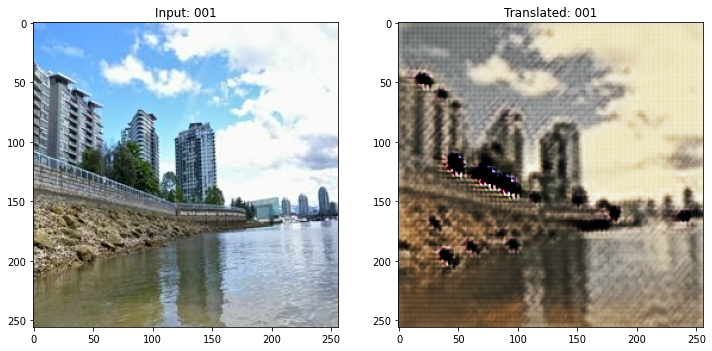

1496/1496 [==============================] - 659s 400ms/step - G_loss: 5.2862 - F_loss: 4.2954 - D_X_loss: 0.1766 - D_Y_loss: 0.1355 - val_G_loss: 3.9621 - val_F_loss: 3.9463 - val_D_X_loss: 0.1288 - val_D_Y_loss: 0.0400
Epoch 2/30
1496/1496 [==============================] - ETA: 0s - G_loss: 4.1493 - F_loss: 3.5120 - D_X_loss: 0.1845 - D_Y_loss: 0.1687

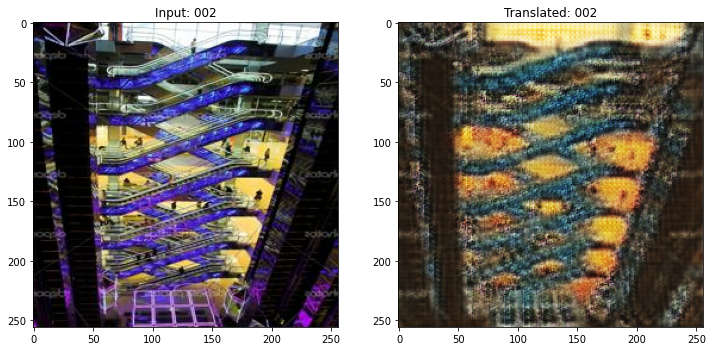

1496/1496 [==============================] - 593s 396ms/step - G_loss: 4.1485 - F_loss: 3.5122 - D_X_loss: 0.1845 - D_Y_loss: 0.1687 - val_G_loss: 3.6041 - val_F_loss: 2.3539 - val_D_X_loss: 0.1484 - val_D_Y_loss: 0.2977
Epoch 3/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.7836 - F_loss: 3.2243 - D_X_loss: 0.1845 - D_Y_loss: 0.1843

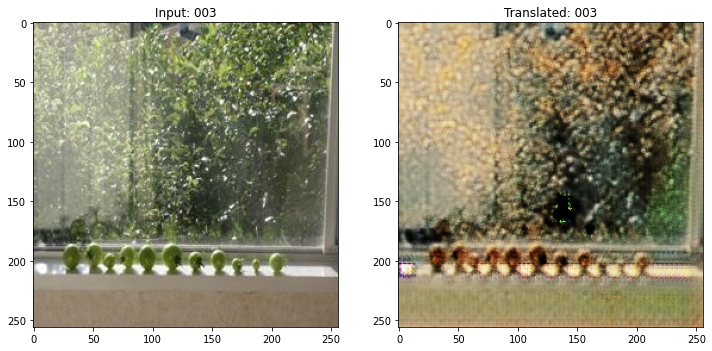

1496/1496 [==============================] - 593s 397ms/step - G_loss: 3.7838 - F_loss: 3.2238 - D_X_loss: 0.1845 - D_Y_loss: 0.1844 - val_G_loss: 5.3830 - val_F_loss: 2.5820 - val_D_X_loss: 0.3369 - val_D_Y_loss: 0.0682
Epoch 4/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.6286 - F_loss: 3.0156 - D_X_loss: 0.2063 - D_Y_loss: 0.1864

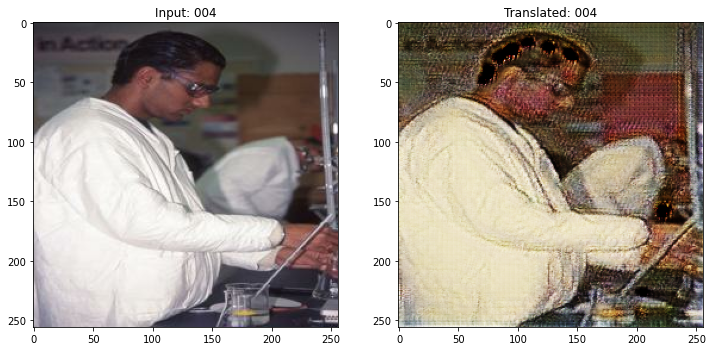

1496/1496 [==============================] - 593s 396ms/step - G_loss: 3.6279 - F_loss: 3.0157 - D_X_loss: 0.2063 - D_Y_loss: 0.1864 - val_G_loss: 3.3570 - val_F_loss: 2.4810 - val_D_X_loss: 0.2060 - val_D_Y_loss: 0.1158
Epoch 5/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.6137 - F_loss: 2.9075 - D_X_loss: 0.2101 - D_Y_loss: 0.1817

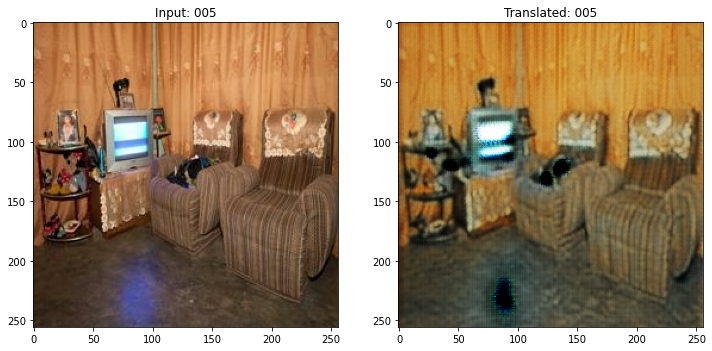

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.6143 - F_loss: 2.9073 - D_X_loss: 0.2101 - D_Y_loss: 0.1818 - val_G_loss: 1.6519 - val_F_loss: 2.1042 - val_D_X_loss: 0.1294 - val_D_Y_loss: 0.1188
Epoch 6/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.5621 - F_loss: 2.8386 - D_X_loss: 0.2174 - D_Y_loss: 0.1819

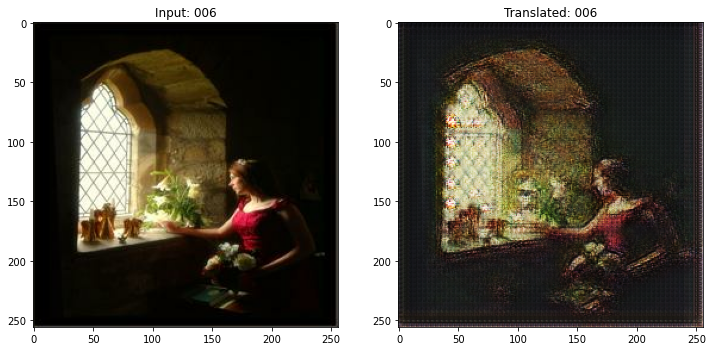

1496/1496 [==============================] - 593s 396ms/step - G_loss: 3.5623 - F_loss: 2.8379 - D_X_loss: 0.2175 - D_Y_loss: 0.1819 - val_G_loss: 2.7253 - val_F_loss: 2.2709 - val_D_X_loss: 0.1931 - val_D_Y_loss: 0.4050
Epoch 7/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.4812 - F_loss: 2.8505 - D_X_loss: 0.2239 - D_Y_loss: 0.1984

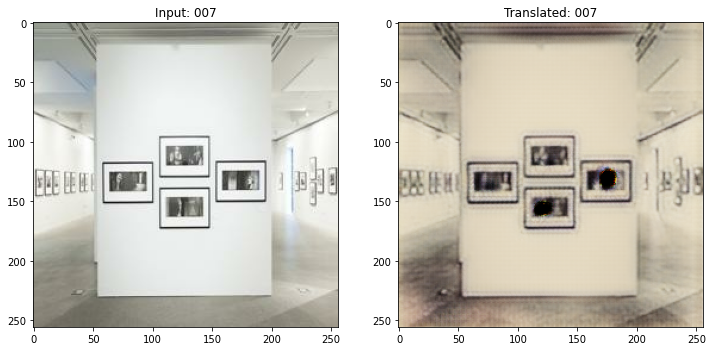

1496/1496 [==============================] - 593s 396ms/step - G_loss: 3.4808 - F_loss: 2.8499 - D_X_loss: 0.2238 - D_Y_loss: 0.1984 - val_G_loss: 6.6332 - val_F_loss: 2.5826 - val_D_X_loss: 0.3254 - val_D_Y_loss: 0.0641
Epoch 8/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.3605 - F_loss: 2.8668 - D_X_loss: 0.2192 - D_Y_loss: 0.2023

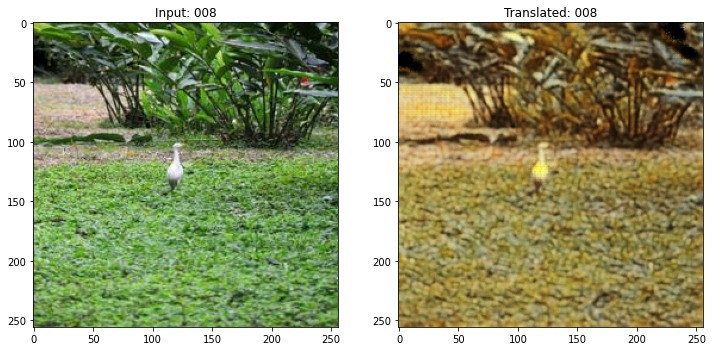

1496/1496 [==============================] - 593s 396ms/step - G_loss: 3.3611 - F_loss: 2.8662 - D_X_loss: 0.2192 - D_Y_loss: 0.2022 - val_G_loss: 2.7609 - val_F_loss: 3.1733 - val_D_X_loss: 0.0925 - val_D_Y_loss: 0.0911
Epoch 9/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.3383 - F_loss: 2.7848 - D_X_loss: 0.2209 - D_Y_loss: 0.2017

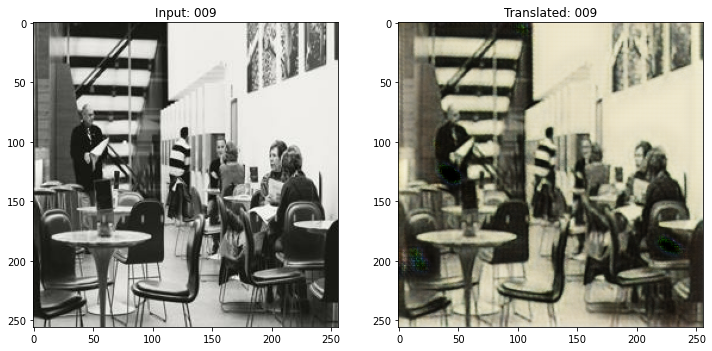

1496/1496 [==============================] - 593s 396ms/step - G_loss: 3.3381 - F_loss: 2.7849 - D_X_loss: 0.2209 - D_Y_loss: 0.2017 - val_G_loss: 2.9573 - val_F_loss: 2.3050 - val_D_X_loss: 0.1669 - val_D_Y_loss: 0.2091
Epoch 10/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.2660 - F_loss: 2.7782 - D_X_loss: 0.2195 - D_Y_loss: 0.2043

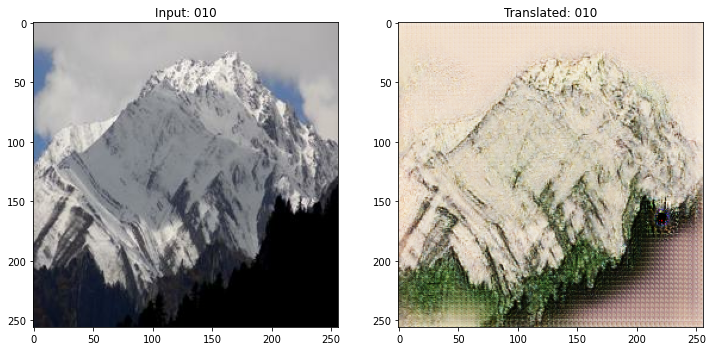

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.2649 - F_loss: 2.7780 - D_X_loss: 0.2195 - D_Y_loss: 0.2043 - val_G_loss: 3.2792 - val_F_loss: 4.8585 - val_D_X_loss: 0.1749 - val_D_Y_loss: 0.1889
Epoch 11/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.2195 - F_loss: 2.7651 - D_X_loss: 0.2188 - D_Y_loss: 0.2063

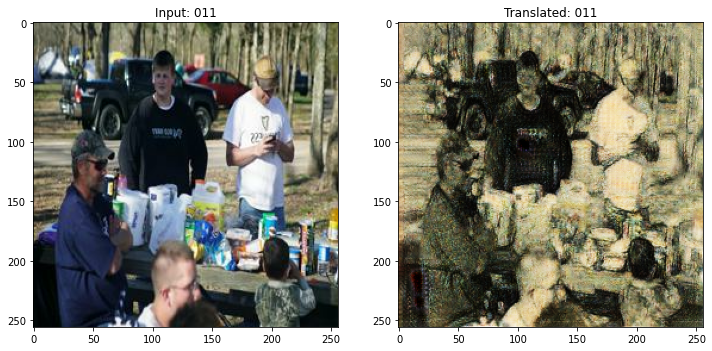

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.2195 - F_loss: 2.7649 - D_X_loss: 0.2188 - D_Y_loss: 0.2063 - val_G_loss: 3.1699 - val_F_loss: 2.8156 - val_D_X_loss: 0.2477 - val_D_Y_loss: 0.2301
Epoch 12/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.1398 - F_loss: 2.7364 - D_X_loss: 0.2122 - D_Y_loss: 0.2084

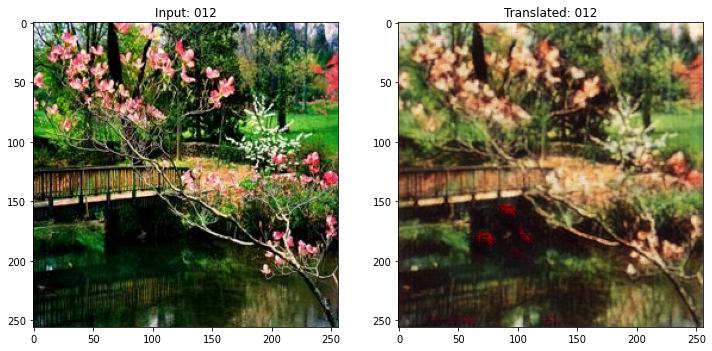

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.1397 - F_loss: 2.7357 - D_X_loss: 0.2122 - D_Y_loss: 0.2083 - val_G_loss: 2.9750 - val_F_loss: 2.0120 - val_D_X_loss: 0.2219 - val_D_Y_loss: 0.1258
Epoch 13/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.1149 - F_loss: 2.7029 - D_X_loss: 0.2133 - D_Y_loss: 0.2093

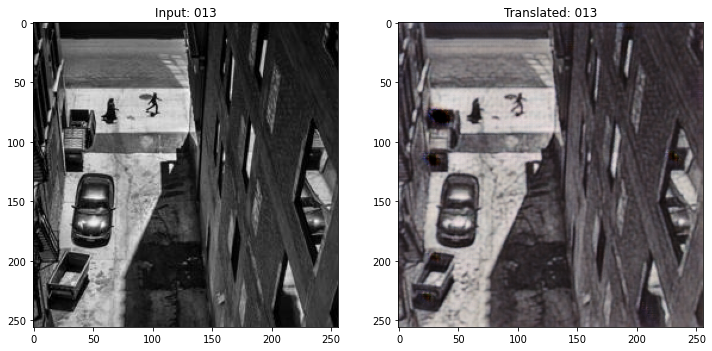

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.1143 - F_loss: 2.7034 - D_X_loss: 0.2134 - D_Y_loss: 0.2094 - val_G_loss: 3.1276 - val_F_loss: 2.0875 - val_D_X_loss: 0.1685 - val_D_Y_loss: 0.2564
Epoch 14/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.0717 - F_loss: 2.6963 - D_X_loss: 0.2112 - D_Y_loss: 0.2089

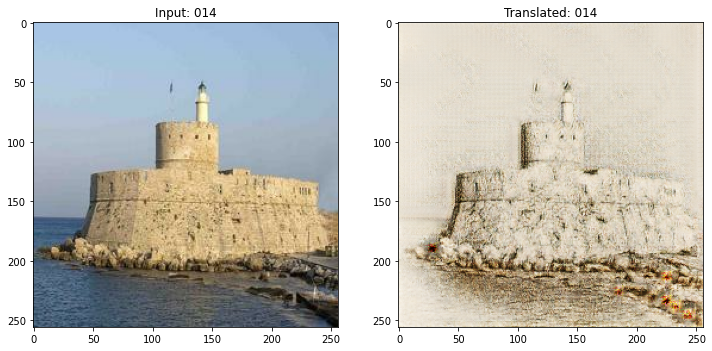

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.0724 - F_loss: 2.6960 - D_X_loss: 0.2112 - D_Y_loss: 0.2089 - val_G_loss: 5.2573 - val_F_loss: 1.5904 - val_D_X_loss: 0.1233 - val_D_Y_loss: 0.1876
Epoch 15/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.0455 - F_loss: 2.6756 - D_X_loss: 0.2096 - D_Y_loss: 0.2083

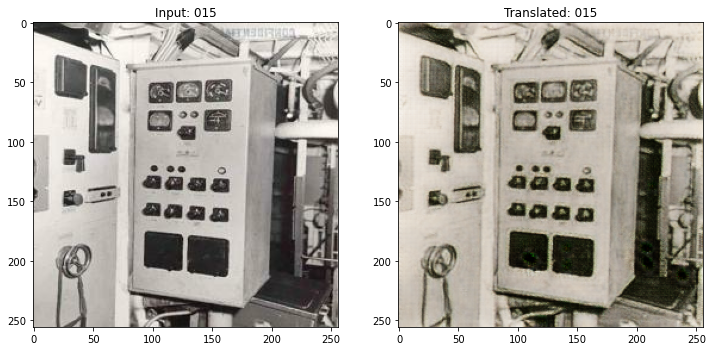

1496/1496 [==============================] - 595s 397ms/step - G_loss: 3.0460 - F_loss: 2.6760 - D_X_loss: 0.2096 - D_Y_loss: 0.2083 - val_G_loss: 4.4152 - val_F_loss: 2.7156 - val_D_X_loss: 0.2100 - val_D_Y_loss: 0.2641
Epoch 16/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.0267 - F_loss: 2.6545 - D_X_loss: 0.2057 - D_Y_loss: 0.2113

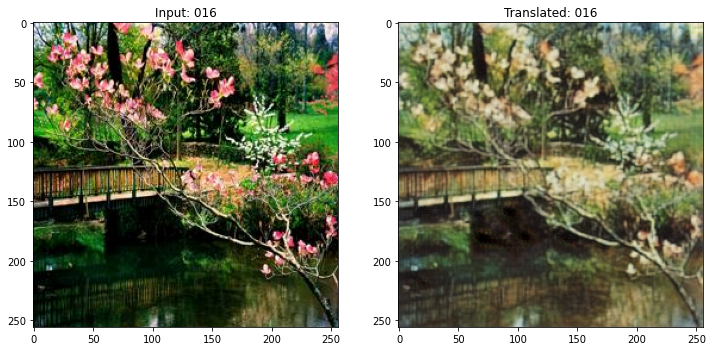

1496/1496 [==============================] - 593s 397ms/step - G_loss: 3.0262 - F_loss: 2.6544 - D_X_loss: 0.2057 - D_Y_loss: 0.2114 - val_G_loss: 4.3407 - val_F_loss: 1.3655 - val_D_X_loss: 0.1714 - val_D_Y_loss: 0.2147
Epoch 17/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.0022 - F_loss: 2.6617 - D_X_loss: 0.1997 - D_Y_loss: 0.2120

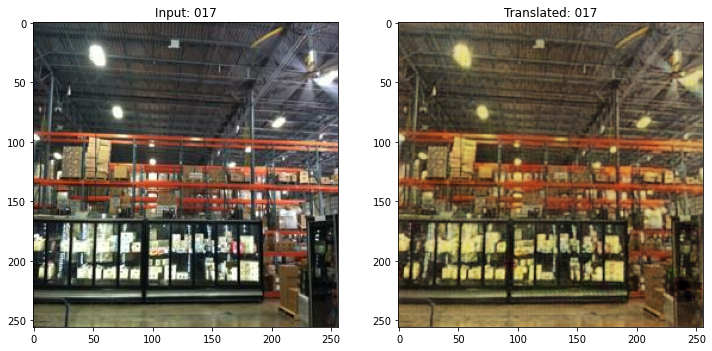

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.0020 - F_loss: 2.6635 - D_X_loss: 0.1997 - D_Y_loss: 0.2120 - val_G_loss: 3.3367 - val_F_loss: 2.5904 - val_D_X_loss: 0.1572 - val_D_Y_loss: 0.2223
Epoch 18/30
1496/1496 [==============================] - ETA: 0s - G_loss: 3.0050 - F_loss: 2.7913 - D_X_loss: 0.1496 - D_Y_loss: 0.2114

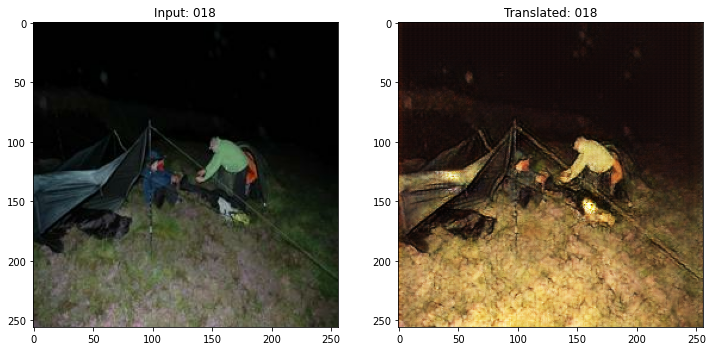

1496/1496 [==============================] - 594s 397ms/step - G_loss: 3.0053 - F_loss: 2.7912 - D_X_loss: 0.1495 - D_Y_loss: 0.2115 - val_G_loss: 3.4140 - val_F_loss: 3.1631 - val_D_X_loss: 0.0436 - val_D_Y_loss: 0.1707
Epoch 19/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9973 - F_loss: 2.9968 - D_X_loss: 0.0981 - D_Y_loss: 0.2147

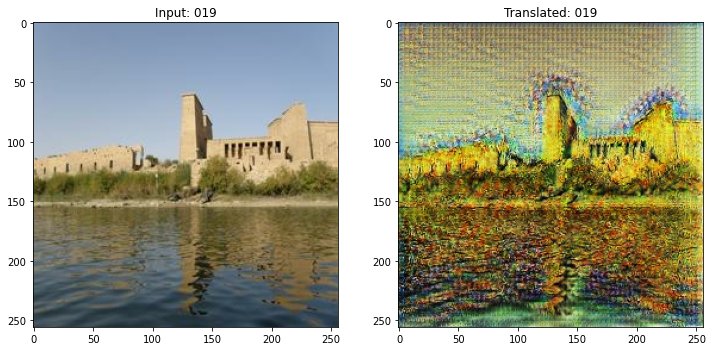

1496/1496 [==============================] - 593s 397ms/step - G_loss: 2.9988 - F_loss: 2.9963 - D_X_loss: 0.0981 - D_Y_loss: 0.2147 - val_G_loss: 3.0315 - val_F_loss: 1.8429 - val_D_X_loss: 0.0680 - val_D_Y_loss: 0.0515
Epoch 20/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9571 - F_loss: 3.0791 - D_X_loss: 0.0715 - D_Y_loss: 0.2122

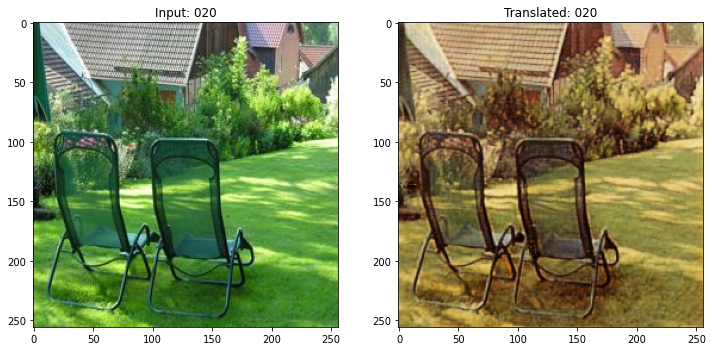

1496/1496 [==============================] - 594s 397ms/step - G_loss: 2.9565 - F_loss: 3.0790 - D_X_loss: 0.0714 - D_Y_loss: 0.2122 - val_G_loss: 3.8540 - val_F_loss: 4.0577 - val_D_X_loss: 0.0549 - val_D_Y_loss: 0.1672
Epoch 21/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9772 - F_loss: 3.1535 - D_X_loss: 0.0584 - D_Y_loss: 0.2156

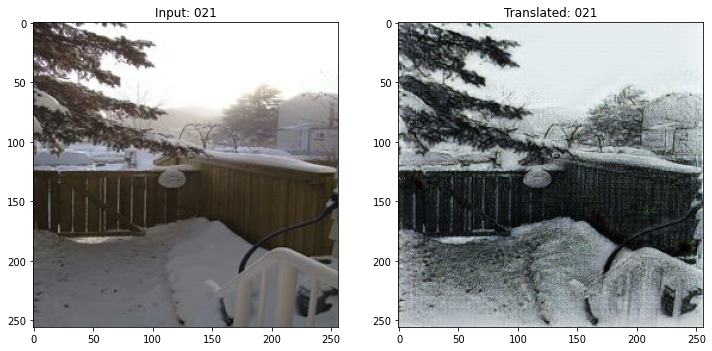

1496/1496 [==============================] - 593s 396ms/step - G_loss: 2.9770 - F_loss: 3.1535 - D_X_loss: 0.0584 - D_Y_loss: 0.2156 - val_G_loss: 2.4914 - val_F_loss: 2.7514 - val_D_X_loss: 0.0865 - val_D_Y_loss: 0.2256
Epoch 22/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9692 - F_loss: 3.1285 - D_X_loss: 0.0591 - D_Y_loss: 0.2139

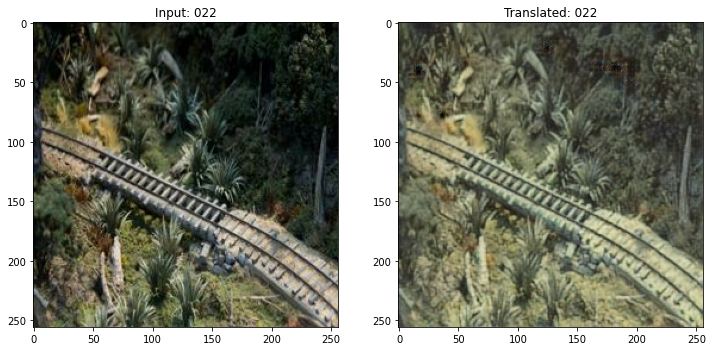

1496/1496 [==============================] - 593s 396ms/step - G_loss: 2.9681 - F_loss: 3.1280 - D_X_loss: 0.0591 - D_Y_loss: 0.2139 - val_G_loss: 2.4043 - val_F_loss: 2.8540 - val_D_X_loss: 0.0740 - val_D_Y_loss: 0.1696
Epoch 23/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9417 - F_loss: 3.1964 - D_X_loss: 0.0582 - D_Y_loss: 0.2151

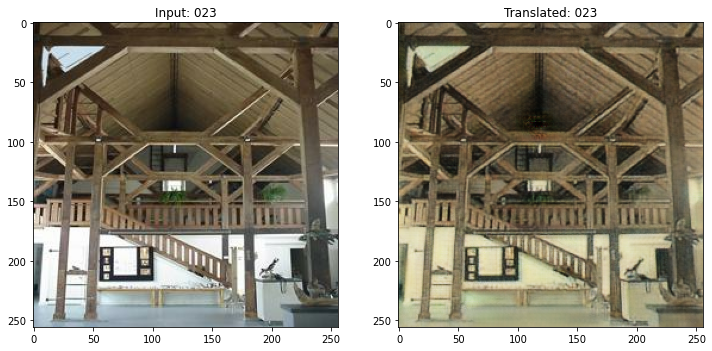

1496/1496 [==============================] - 593s 396ms/step - G_loss: 2.9417 - F_loss: 3.1967 - D_X_loss: 0.0582 - D_Y_loss: 0.2150 - val_G_loss: 2.2359 - val_F_loss: 3.7829 - val_D_X_loss: 0.0585 - val_D_Y_loss: 0.1846
Epoch 24/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9344 - F_loss: 3.1748 - D_X_loss: 0.0640 - D_Y_loss: 0.2147

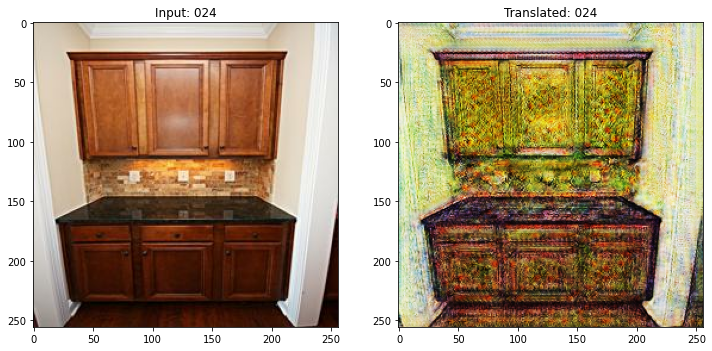

1496/1496 [==============================] - 593s 396ms/step - G_loss: 2.9351 - F_loss: 3.1747 - D_X_loss: 0.0640 - D_Y_loss: 0.2147 - val_G_loss: 2.5452 - val_F_loss: 2.5493 - val_D_X_loss: 0.0336 - val_D_Y_loss: 0.2580
Epoch 25/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.9149 - F_loss: 3.1321 - D_X_loss: 0.0712 - D_Y_loss: 0.2199

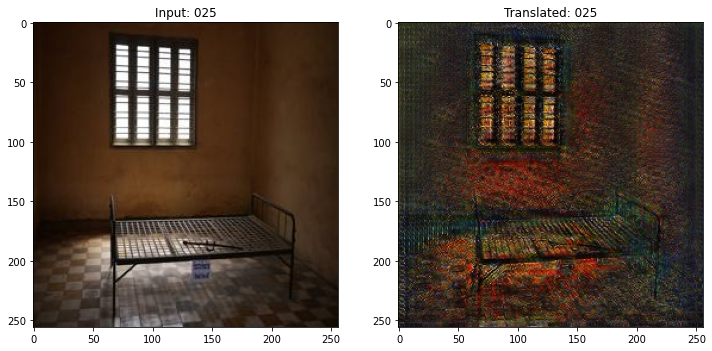

1496/1496 [==============================] - 594s 397ms/step - G_loss: 2.9153 - F_loss: 3.1315 - D_X_loss: 0.0712 - D_Y_loss: 0.2199 - val_G_loss: 3.3169 - val_F_loss: 4.5121 - val_D_X_loss: 0.1691 - val_D_Y_loss: 0.3931
Epoch 26/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.8552 - F_loss: 3.0738 - D_X_loss: 0.0860 - D_Y_loss: 0.2217

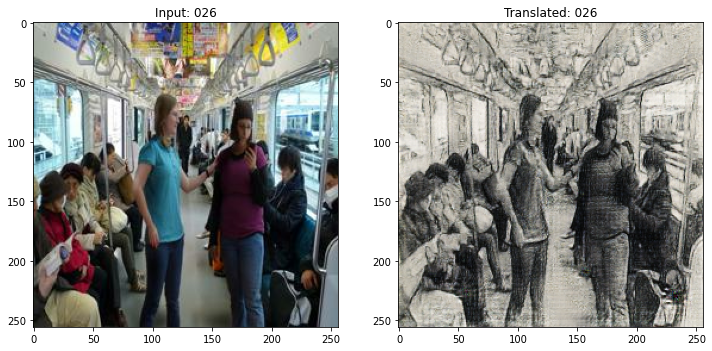

1496/1496 [==============================] - 593s 397ms/step - G_loss: 2.8556 - F_loss: 3.0735 - D_X_loss: 0.0861 - D_Y_loss: 0.2216 - val_G_loss: 1.8520 - val_F_loss: 3.5786 - val_D_X_loss: 0.1275 - val_D_Y_loss: 0.2241
Epoch 27/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.8347 - F_loss: 3.0068 - D_X_loss: 0.1082 - D_Y_loss: 0.2177

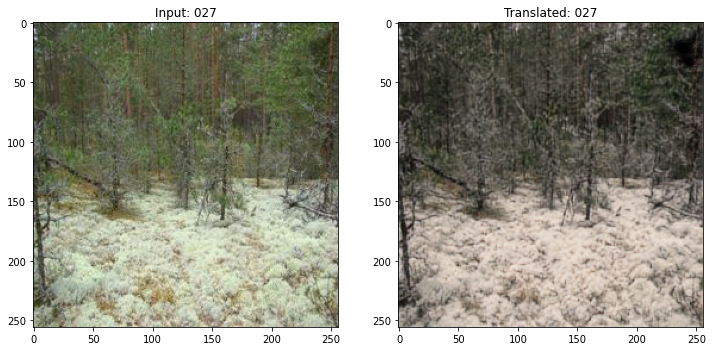

1496/1496 [==============================] - 593s 397ms/step - G_loss: 2.8339 - F_loss: 3.0082 - D_X_loss: 0.1083 - D_Y_loss: 0.2177 - val_G_loss: 1.6415 - val_F_loss: 3.8426 - val_D_X_loss: 0.1594 - val_D_Y_loss: 0.2538
Epoch 28/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.8164 - F_loss: 2.8885 - D_X_loss: 0.1295 - D_Y_loss: 0.2150

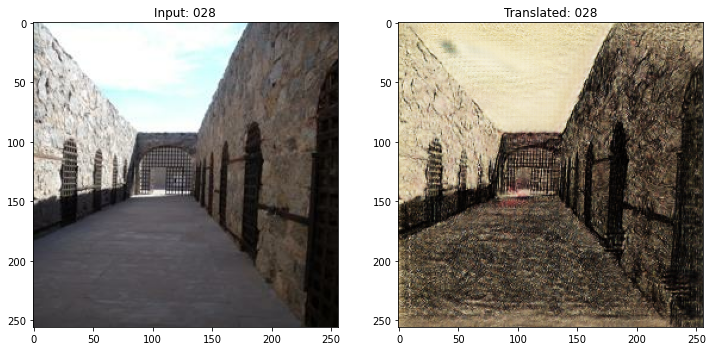

1496/1496 [==============================] - 593s 396ms/step - G_loss: 2.8161 - F_loss: 2.8887 - D_X_loss: 0.1296 - D_Y_loss: 0.2151 - val_G_loss: 3.1043 - val_F_loss: 4.2395 - val_D_X_loss: 0.0635 - val_D_Y_loss: 0.2636
Epoch 29/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.7963 - F_loss: 2.8720 - D_X_loss: 0.1406 - D_Y_loss: 0.2179

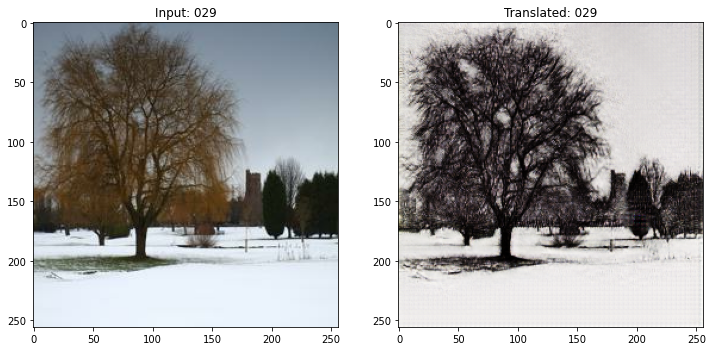

1496/1496 [==============================] - 593s 396ms/step - G_loss: 2.7956 - F_loss: 2.8721 - D_X_loss: 0.1406 - D_Y_loss: 0.2179 - val_G_loss: 2.7135 - val_F_loss: 3.0152 - val_D_X_loss: 0.0445 - val_D_Y_loss: 0.2010
Epoch 30/30
1496/1496 [==============================] - ETA: 0s - G_loss: 2.7479 - F_loss: 2.7891 - D_X_loss: 0.1503 - D_Y_loss: 0.2204

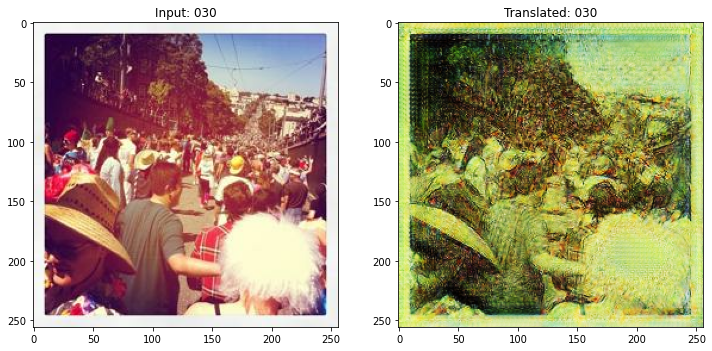

1496/1496 [==============================] - 594s 397ms/step - G_loss: 2.7472 - F_loss: 2.7908 - D_X_loss: 0.1502 - D_Y_loss: 0.2204 - val_G_loss: 2.3901 - val_F_loss: 4.7906 - val_D_X_loss: 0.1256 - val_D_Y_loss: 0.2254


In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generator
def generator_loss_fn(fake):
  fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
  return fake_loss

# Define the loss function for the discriminator
def discriminator_loss_fn(real, fake):
  real_loss = adv_loss_fn(tf.ones_like(real), real)
  fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
  return (real_loss + fake_loss) * 0.5

cyclegan = CycleGAN(
    generator_G=gen_G,
    generator_F=gen_F,
    discriminator_X=disc_X,
    discriminator_Y=disc_Y
)

cyclegan.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn
)

history = cyclegan.fit(
    tf.data.Dataset.zip((train_content_ds, train_style_ds)),
    validation_data=tf.data.Dataset.zip((val_content_ds, val_style_ds)),
    epochs=EPOCHS,
    callbacks=callbacks
)

### Result

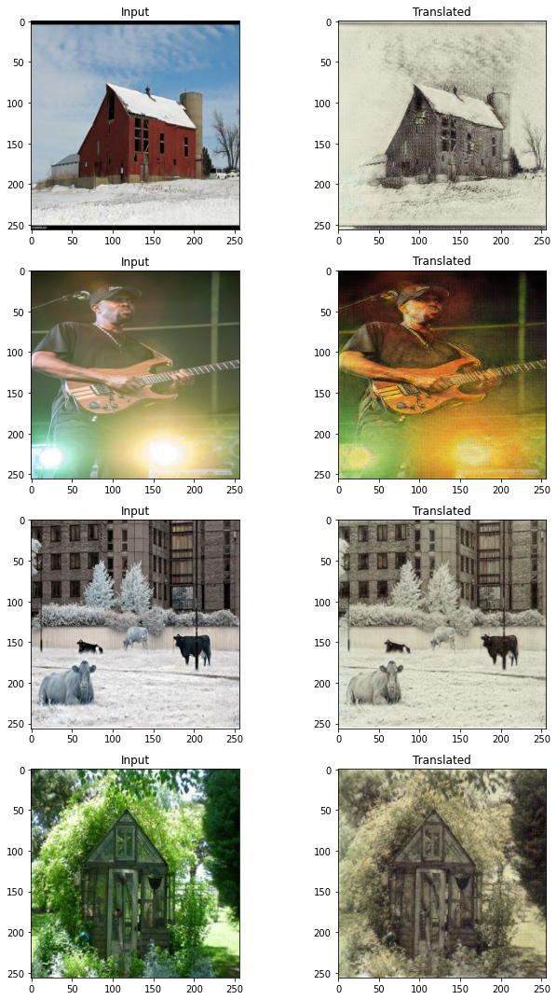

In [ ]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(test_content_ds.take(4)):
    prediction = cyclegan.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Translated")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

In [ ]:
import glob
from PIL import Image

fpath = "model_results/{MODEL_NAME}_{EPOCH}.png"
fout = f"{MODEL_NAME}_{EPOCHS}.gif"

imgs = []
for i in range(EPOCHS):
  imgs.append(Image.open(fpath.format(MODEL_NAME=MODEL_NAME, EPOCH=i+1)))

imgs = iter(imgs)
img = next(imgs)
img.save(fp=fout, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)